# Trajectory tracking with PID control

In [1]:
import gym,warnings
# Remove anoying warning messages
warnings.filterwarnings("ignore") 
gym.logger.set_level(40)
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from lgrp_class import lgrp_class # Gaussian random path
from custom_ant import AntEnvCustom # Custom Ant
from util import PID_class,display_frames_as_gif,\
    quaternion_to_euler_angle,multi_dim_interp,track_traj_with_pid
print ("Packages loaded.")

Packages loaded.


### Initialize env

In [2]:
env = AntEnvCustom()
obs_dim,act_dim,dT = env.observation_space.shape[0],env.action_space.shape[0],env.dt
obs,reward,done,_ = env.step(np.zeros(act_dim))

Custom Ant Environment made by SJ.


### Gaussian Random Paths

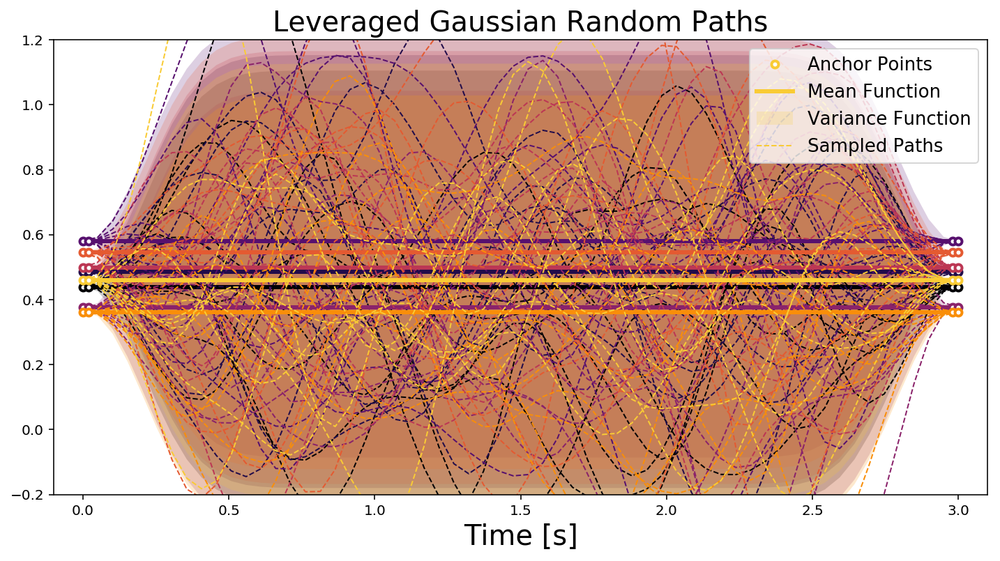

Ant initialized. obs_dim:[111] act_dim:[8] dt:[0.050sec]


In [47]:
tMin,tMax,dim,nData = 0,3,act_dim,2 # if nData is 2, GP prior. 
nTest = (int)((tMax-tMin)/dT)
tData = np.linspace(start=tMin,stop=tMax,num=nData).reshape((-1,1))
xData = np.random.rand(nData,dim) # Random positions 
xData[0,:] = xData[0,:]/3.0+1.0/3.0
xData[-1,:] = xData[0,:]
lData = np.ones(shape=(nData,1))
lData[1:nData-1] = 0.5
tTest = np.linspace(start=tMin,stop=tMax,num=nTest).reshape((-1,1))
lTest = np.ones(shape=(nTest,1))
hyp = {'gain':1/3,'len':1/3,'noise':1e-8} # {'gain':1/4,'len':1/3,'noise':1e-8}
G = lgrp_class(_name='LGRP',_tData=tData,_xData=xData,_lData=lData,
               _tTest=tTest,_lTest=lTest,_hyp=hyp)
G.plot_all(_nPath=10)
print ("Ant initialized. obs_dim:[%d] act_dim:[%d] dt:[%.3fsec]"
       %(obs_dim,act_dim,env.dt))

### Set PID controller

In [48]:
# Set PID controller (Kp=0.02,Ki=0.00001,Kd=0.001,windup=10000)
PID = PID_class(Kp=0.01,Ki=0.00001,Kd=0.002,windup=5000,sample_time=dT,dim=8)

### Pursuit sampled trajectory from GRP prior

In [57]:
maxRepeat = 2 # Number of repeat
sampledTrajs = G.sample_paths(_nPath=1)
sampledTraj = sampledTrajs[0]
pursuitTraj = env.minPosDeg+(env.maxPosDeg-env.minPosDeg)*sampledTraj
timeList,cPosDegList,rPosDegList,frames,titleStrs \
    = track_traj_with_pid(env,PID,pursuitTraj,maxRepeat)

Repeat:[2] done. Avg reward is [1.022]. xDisp is [0.366]. hDisp is [68.530].


### Pursuit GRP posterior mean trajectory

In [50]:
nInterp = 10
tInterp = np.linspace(start=tMin,stop=tMax,num=nInterp).reshape((-1,1))
xInterp = multi_dim_interp(tInterp,tTest,sampledTraj)
lInterp = np.ones_like(tInterp)
G2 = lgrp_class(_name='LGRP2',_tData=tInterp,_xData=xInterp,_lData=lInterp,
               _tTest=tTest,_lTest=lTest,_hyp=hyp)
pursuitTraj2 = env.minPosDeg+(env.maxPosDeg-env.minPosDeg)*G2.muTest # Use mean path!
timeList2,cPosDegList2,rPosDegList2,frames2,titleStrs2 \
    = track_traj_with_pid(env,PID,pursuitTraj2,maxRepeat)

Repeat:[2] done. Avg reward is [0.900]. xDisp is [-0.460]. hDisp is [36.419].


### Plot trajectories and animate GRP prior

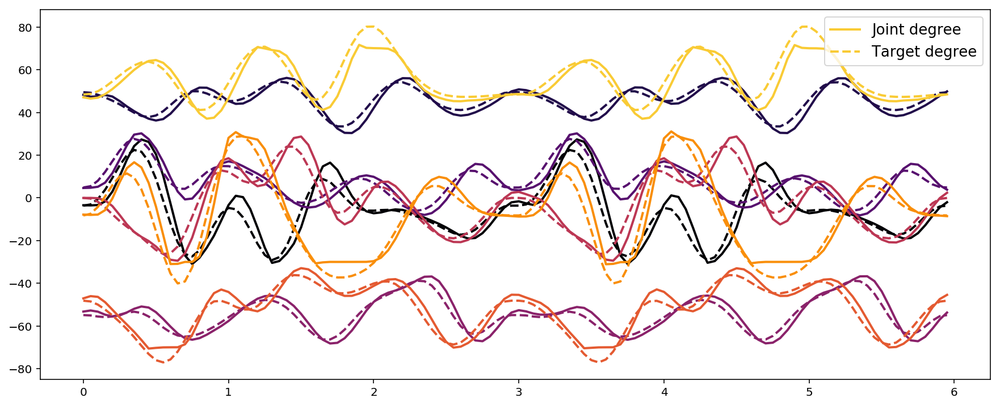

Making [120]-length gif ...



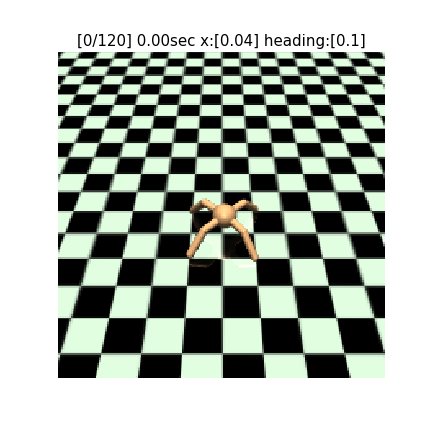
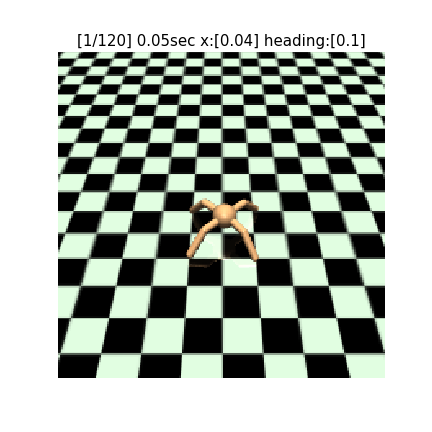
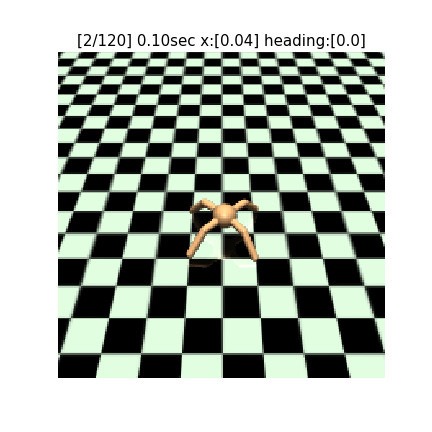
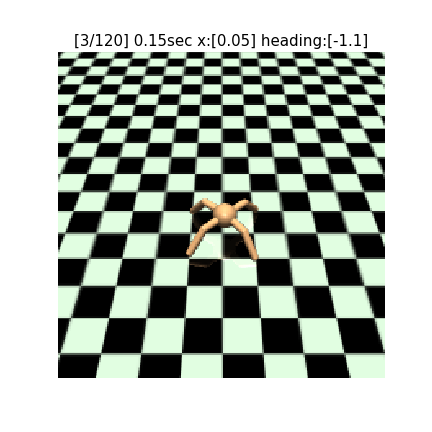
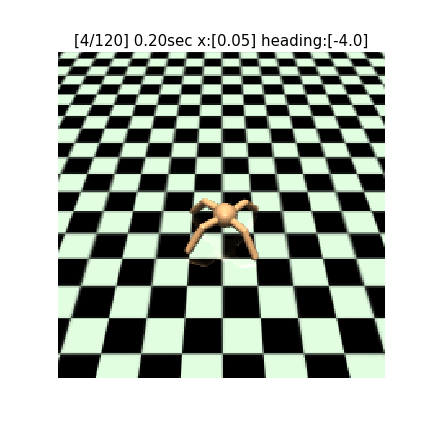
...
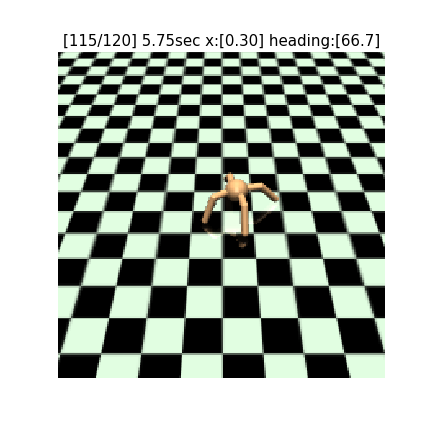
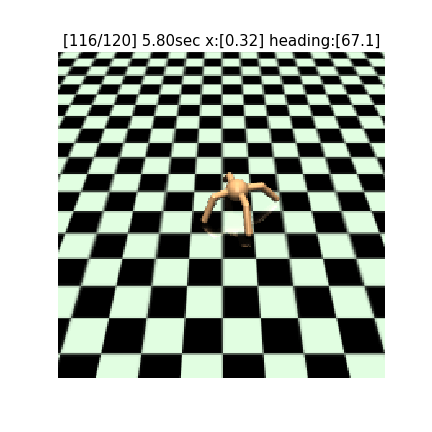
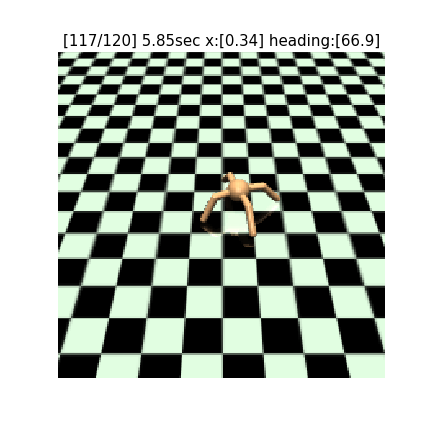
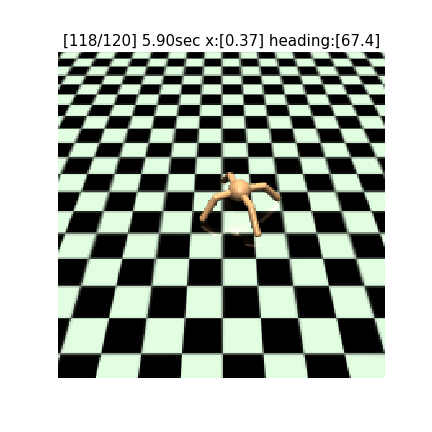
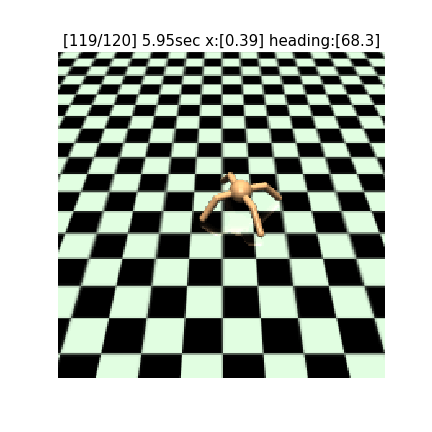

In [58]:
PLOT_TRAJ,ANIMATE = True,True
if PLOT_TRAJ:
    dim = pursuitTraj.shape[1]
    cmap = plt.get_cmap('inferno')
    colors = [cmap(i) for i in np.linspace(0,1,dim+1)]
    plt.figure(figsize=(15,6))
    for dIdx in range(dim):
        hPos,=plt.plot(timeList,cPosDegList[:,dIdx],linestyle='-',color=colors[dIdx],lw=2)
        hTrg,=plt.plot(timeList,rPosDegList[:,dIdx],linestyle='--',color=colors[dIdx],lw=2)
    plt.legend([hPos,hTrg],['Joint degree','Target degree'],fontsize=13);plt.show()
if ANIMATE:
    print ("Making [%d]-length gif ..."%(len(frames)))
    display_frames_as_gif(frames,_intv_ms=20,_figsize=(6,6),_fontsize=15,_titleStrs=titleStrs)

### Plot trajectories and animate GRP posterior mean

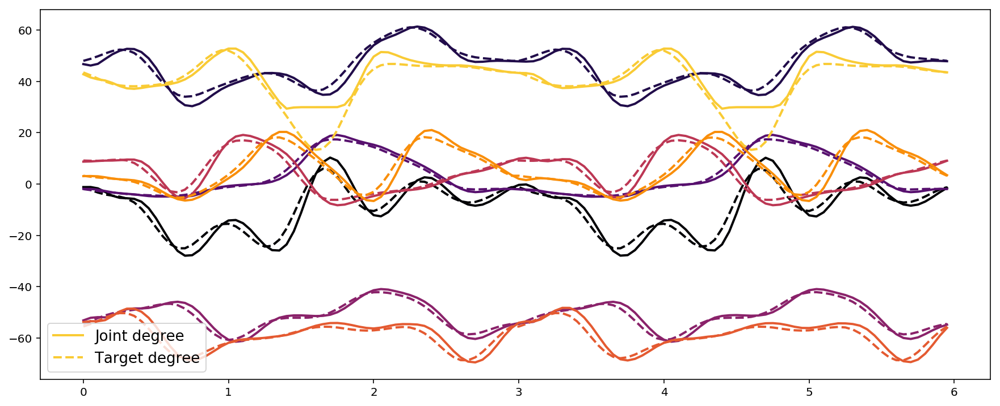

Making [120]-length gif ...



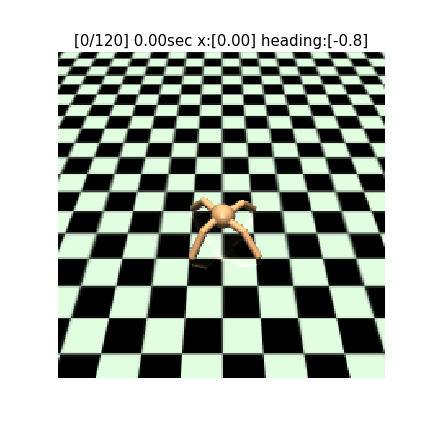
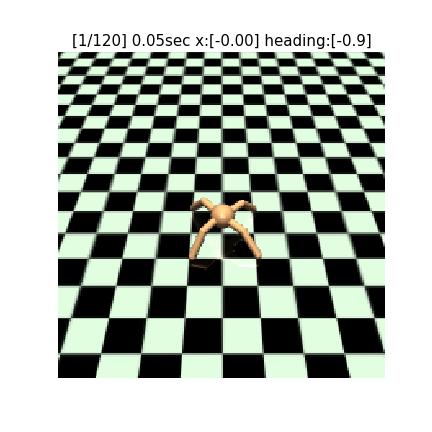
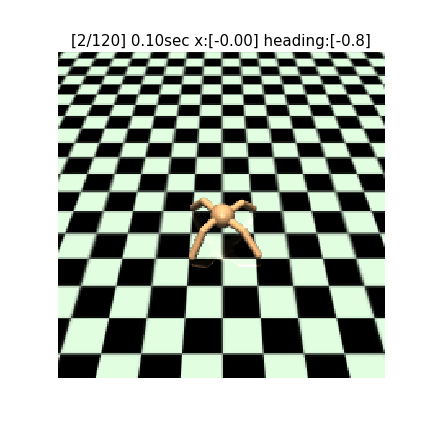
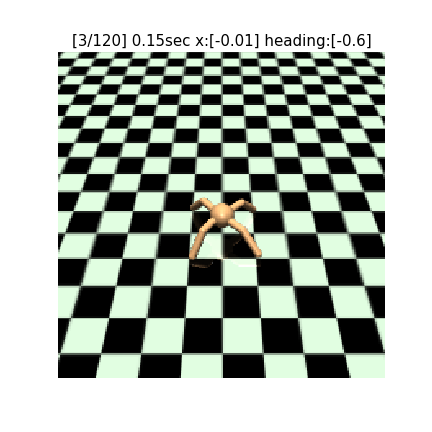
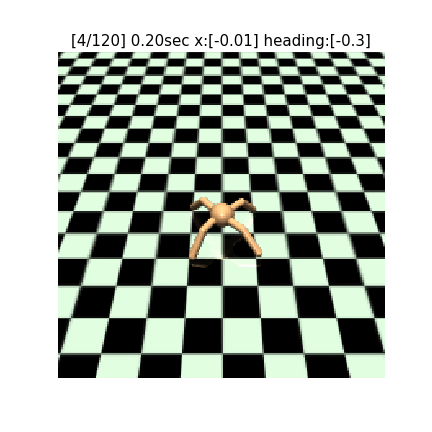
...
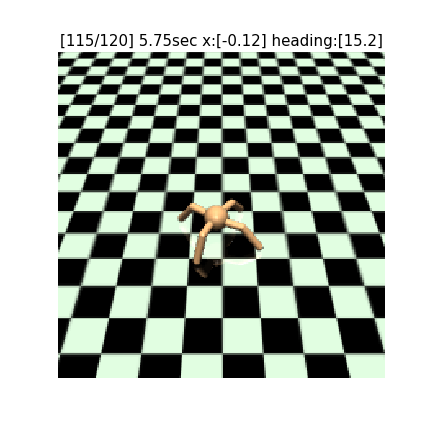
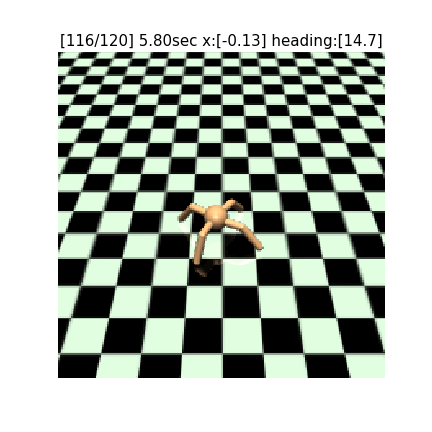
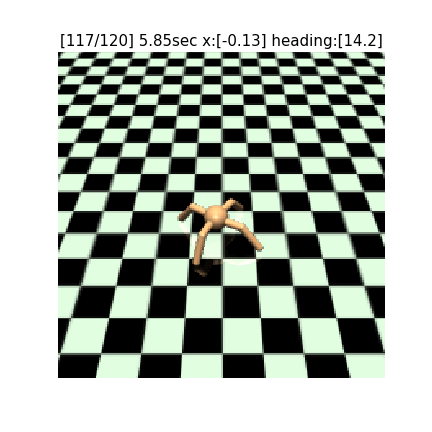
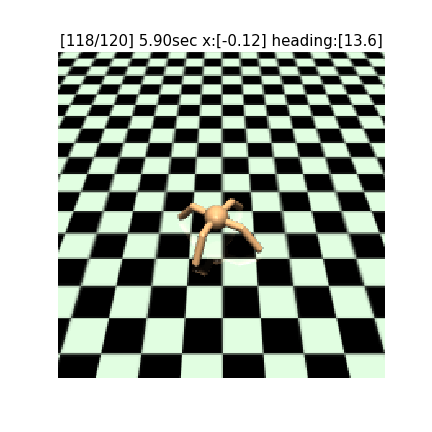
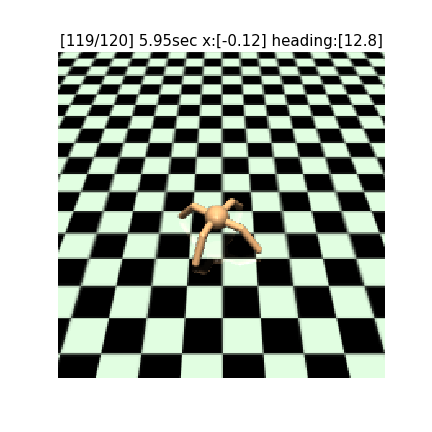

In [45]:
PLOT_TRAJ,ANIMATE = True,True
if PLOT_TRAJ:
    dim = pursuitTraj2.shape[1]
    cmap = plt.get_cmap('inferno')
    colors = [cmap(i) for i in np.linspace(0,1,dim+1)]
    plt.figure(figsize=(15,6))
    for dIdx in range(dim):
        hPos,=plt.plot(timeList2,cPosDegList2[:,dIdx],linestyle='-',color=colors[dIdx],lw=2)
        hTrg,=plt.plot(timeList2,rPosDegList2[:,dIdx],linestyle='--',color=colors[dIdx],lw=2)
    plt.legend([hPos,hTrg],['Joint degree','Target degree'],fontsize=13);plt.show()
if ANIMATE:
    print ("Making [%d]-length gif ..."%(len(frames)))
    display_frames_as_gif(frames2,_intv_ms=20,_figsize=(6,6),_fontsize=15,_titleStrs=titleStrs2)